In [42]:
import matplotlib
matplotlib.use('agg')  # allows notebook to be tested in Travis

import pandas as pd
import cartopy.crs as ccrs
import cartopy
import matplotlib.pyplot as plt
import pandana as pdna
from pandana.loaders import osm
import time


import urbanaccess as ua
from urbanaccess.config import settings
from urbanaccess.gtfsfeeds import feeds
from urbanaccess import gtfsfeeds
from urbanaccess.gtfs.gtfsfeeds_dataframe import gtfsfeeds_dfs
from urbanaccess.network import ua_network, load_network

%matplotlib inline

In [2]:
settings.log_console = False

In [3]:
feeds.to_dict()

{'gtfs_feeds': {}}

In [8]:
gtfsfeeds.search(search_text='Grand River Transit',
                 search_field=None,
                 match='contains')

Note: Your use of a GTFS feed is governed by each GTFS feed author license terms. It is suggested you read the respective license terms for the appropriate use of a GTFS feed.
Found 1 records that matched ['Grand River Transit'] inside ['name', 'url', 'dataexchange_id', 'feed_baseurl'] columns:


,date_last_updated,dataexchange_url,date_added,is_official,feed_baseurl,name,area,url,country,state,license_url,dataexchange_id
385,2015-12-17 10:10:42,http://www.gtfs-data-exchange.com/agency/grand...,2011-05-31 02:51:30,True,NaN,Grand River Transit,Waterloo,http://www.grt.ca/,Canada,Ontario,http://www.grt.ca/en/doingBusiness/supportings...,grand-river-transit


In [9]:
gtfsfeeds.search(search_text='Grand River Transit',
                 search_field=None,
                 match='contains',
                 add_feed=True)

Note: Your use of a GTFS feed is governed by each GTFS feed author license terms. It is suggested you read the respective license terms for the appropriate use of a GTFS feed.
Found 1 records that matched ['Grand River Transit'] inside ['name', 'url', 'dataexchange_id', 'feed_baseurl'] columns:
Added 1 feeds to gtfs_feeds: {'Grand River Transit': 'http://www.gtfs-data-exchange.com/agency/grand-river-transit/latest.zip'}
Added 1 records to gtfs_feed list:


{'Grand River Transit': 'http://www.gtfs-data-exchange.com/agency/grand-river-transit/latest.zip'}

In [10]:
feeds.to_dict()

{'gtfs_feeds': {'ac transit': 'http://www.regionofwaterloo.ca/opendatadownloads/GRT_GTFS.zip',
  'Grand River Transit': 'http://www.gtfs-data-exchange.com/agency/grand-river-transit/latest.zip'}}

In [11]:
gtfsfeeds.download()

2 GTFS feed(s) will be downloaded here: data\gtfsfeed_zips
ac transit GTFS feed downloaded successfully. Took 7.09 seconds for 3,629,888.0KB
Grand River Transit GTFS feed downloaded successfully. Took 10.84 seconds for 6,394,717.0KB
GTFS feed download completed. Took 17.93 seconds
ac transit.zip successfully extracted to: data\gtfsfeed_text\ac transit
Bay Area Rapid Transit.zip successfully extracted to: data\gtfsfeed_text\Bay Area Rapid Transit
Grand River Transit.zip successfully extracted to: data\gtfsfeed_text\Grand River Transit
GTFS feed zipfile extraction completed. Took 0.39 seconds for 3 files


In [12]:
validation = True
verbose = True
# bbox for City of Waterloo
bbox = (-80.651589,43.415637,-80.402851,43.562582)
remove_stops_outsidebbox = True
append_definitions = True

loaded_feeds = ua.gtfs.load.gtfsfeed_to_df(gtfsfeed_path=None,
                                           validation=validation,
                                           verbose=verbose,
                                           bbox=bbox,
                                           remove_stops_outsidebbox=remove_stops_outsidebbox,
                                           append_definitions=append_definitions)

Checking GTFS text file header whitespace... Reading files using encoding: utf-8 set in configuration.
GTFS text file header whitespace check completed. Took 0.48 seconds
--------------------------------
Processing GTFS feed: ac transit
The unique agency id: grand_river_transit was generated using the name of the agency in the agency.txt file.
Unique agency id operation complete. Took 0.03 seconds
Unique GTFS feed id operation complete. Took 0.01 seconds
Records:
        stop_id  stop_code                 stop_name  stop_desc   stop_lat  \
11         1011     1011.0        Franklin / Lindsay        NaN  43.396304   
20         1020     1020.0     Maple Grove / Boxwood        NaN  43.427063   
21         1021     1021.0     Maple Grove / Boxwood        NaN  43.426855   
22         1022     1022.0         Huron / Strasburg        NaN  43.392897   
28         1029     1029.0            Cooper / Queen        NaN  43.432338   
...         ...        ...                       ...        ... 

In [13]:
loaded_feeds.stops.head()

,stop_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,wheelchair_boarding,platform_code,unique_agency_id,unique_feed_id,route_type,stop_timezone,location_type_desc,wheelchair_boarding_desc
0,1000,1000.0,Frederick Station (Frederick / King),NaN,43.449665,-80.487205,NaN,https://www.grt.ca/en/schedules-maps/terminals...,0,NaN,1.0,NaN,grand_river_transit,ac_transit_1,3.0,NaN,stop,At least some vehicles at this stop can be boa...
1,1001,1001.0,Frederick / Region Of Waterloo Headquarters,NaN,43.452326,-80.484192,NaN,NaN,0,NaN,1.0,NaN,grand_river_transit,ac_transit_1,3.0,NaN,stop,At least some vehicles at this stop can be boa...
2,1002,1002.0,Frederick / Otto,NaN,43.452995,-80.482913,NaN,NaN,0,NaN,1.0,NaN,grand_river_transit,ac_transit_1,3.0,NaN,stop,At least some vehicles at this stop can be boa...
3,1003,1003.0,Frederick / Samuel,NaN,43.454826,-80.479511,NaN,NaN,0,NaN,1.0,NaN,grand_river_transit,ac_transit_1,3.0,NaN,stop,At least some vehicles at this stop can be boa...
4,1004,1004.0,Frederick / Merner,NaN,43.456210,-80.476903,NaN,NaN,0,NaN,1.0,NaN,grand_river_transit,ac_transit_1,3.0,NaN,stop,At least some vehicles at this stop can be boa...


<AxesSubplot:xlabel='stop_lon', ylabel='stop_lat'>

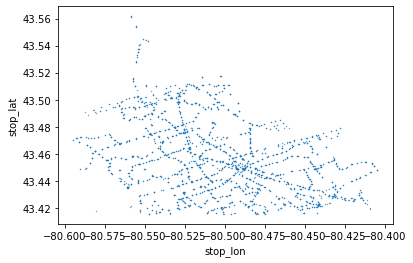

In [14]:
loaded_feeds.stops.plot(kind='scatter', x='stop_lon', y='stop_lat', s=0.1)

In [15]:
ua.gtfs.network.create_transit_net(gtfsfeeds_dfs=loaded_feeds,
                                   day='monday',
                                   timerange=['07:00:00', '10:00:00'],
                                   calendar_dates_lookup=None)

Using calendar to extract service_ids to select trips.
15 service_ids were extracted from calendar
14,038 trip(s) 34.59 percent of 40,589 total trip records were found in calendar for GTFS feed(s): ['bay area rapid transit', 'grand river transit']
0 trip(s) 0 percent of 40,589 total trip records were found in calendar for GTFS feed: ac transit
NOTE: If you expected more trips to have been extracted and your GTFS feed(s) have a calendar_dates file, consider utilizing the calendar_dates_lookup parameter in order to add additional trips based on information inside of calendar_dates. This should only be done if you know the corresponding GTFS feed is using calendar_dates instead of calendar to specify service_ids. When in doubt do not use the calendar_dates_lookup parameter.
14,038 trip(s) 34.59 percent of 40,589 total trip records were not found in calendar for GTFS feed: ac transit
14,038 trip(s) 34.59 percent of 40,589 total trip records were not found in calendar for GTFS feed: bay are

In [16]:
urbanaccess_net = ua.network.ua_network

In [17]:
urbanaccess_net.transit_edges.head()

,node_id_from,node_id_to,weight,unique_agency_id,unique_trip_id,sequence,id,route_type,unique_route_id,net_type
0,1555_grand_river_transit,2584_grand_river_transit,1.0,grand_river_transit,114949802_grand_river_transit,1,114949802_grand_river_transit_1,3,9904_grand_river_transit,transit
1,2584_grand_river_transit,2585_grand_river_transit,1.0,grand_river_transit,114949802_grand_river_transit,2,114949802_grand_river_transit_2,3,9904_grand_river_transit,transit
2,2585_grand_river_transit,2596_grand_river_transit,0.0,grand_river_transit,114949802_grand_river_transit,3,114949802_grand_river_transit_3,3,9904_grand_river_transit,transit
3,2596_grand_river_transit,2597_grand_river_transit,1.0,grand_river_transit,114949802_grand_river_transit,4,114949802_grand_river_transit_4,3,9904_grand_river_transit,transit
4,2597_grand_river_transit,2599_grand_river_transit,1.0,grand_river_transit,114949802_grand_river_transit,5,114949802_grand_river_transit_5,3,9904_grand_river_transit,transit


In [18]:
urbanaccess_net.transit_nodes.head()

,x,y,unique_agency_id,route_type,stop_id,stop_name,parent_station,stop_code,wheelchair_boarding,zone_id,location_type,net_type
node_id,,,,,,,,,,,,
1000_grand_river_transit,-80.487205,43.449665,grand_river_transit,3.0,1000,Frederick Station (Frederick / King),NaN,1000.0,1.0,NaN,0,transit
1001_grand_river_transit,-80.484192,43.452326,grand_river_transit,3.0,1001,Frederick / Region Of Waterloo Headquarters,NaN,1001.0,1.0,NaN,0,transit
1002_grand_river_transit,-80.482913,43.452995,grand_river_transit,3.0,1002,Frederick / Otto,NaN,1002.0,1.0,NaN,0,transit
1003_grand_river_transit,-80.479511,43.454826,grand_river_transit,3.0,1003,Frederick / Samuel,NaN,1003.0,1.0,NaN,0,transit
1004_grand_river_transit,-80.476903,43.456210,grand_river_transit,3.0,1004,Frederick / Merner,NaN,1004.0,1.0,NaN,0,transit


<AxesSubplot:xlabel='x', ylabel='y'>

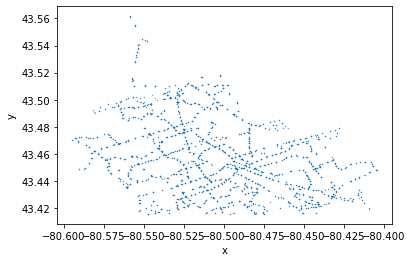

In [19]:
urbanaccess_net.transit_nodes.plot(kind='scatter', x='x', y='y', s=0.1)

In [20]:
nodes, edges = ua.osm.load.ua_network_from_bbox(bbox=bbox,
                                                remove_lcn=True)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](43.41563700,-80.65158900,43.56258200,-80.40285100);>;);out;'}"
Downloaded 20,813.9KB from www.overpass-api.de in 5.48 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 6.25 seconds
Returning OSM data with 136,204 nodes and 30,399 ways...
Edge node pairs completed. Took 73.44 seconds
Returning processed graph with 44,795 nodes and 130,220 edges...
Completed OSM data download and Pandana node and edge table creation in 84.21 seconds
checking for low connectivity nodes...
46 out of 44,795 nodes (0.10 percent of total) were identified as having low connectivity and have been removed.
Completed OSM data download and graph node and edge table creati

In [21]:
ua.osm.network.create_osm_net(osm_edges=edges,
                              osm_nodes=nodes,
                              travel_speed_mph=3)

Created OSM network with travel time impedance using a travel speed of 3 MPH. Took 0.00 seconds


<AxesSubplot:xlabel='x', ylabel='y'>

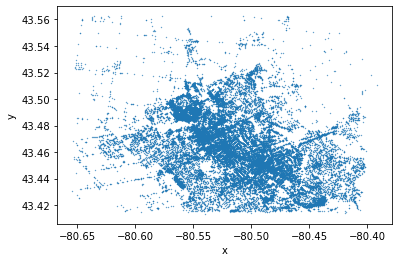

In [22]:
urbanaccess_net.osm_nodes.plot(kind='scatter', x='x', y='y', s=0.1)

In [23]:
ua.network.integrate_network(urbanaccess_network=urbanaccess_net,
                             headways=False)

Loaded UrbanAccess network components comprised of:
     Transit: 2,742 nodes and 52,264 edges;
     OSM: 44,749 nodes and 130,126 edges
Connector edges between the OSM and transit network nodes successfully completed. Took 1.59 seconds
Edge and node tables formatted for Pandana with integer node ids: id_int, to_int, and from_int. Took 3.55 seconds
Network edge and node network integration completed successfully resulting in a total of 47,491 nodes and 320,484 edges:
     Transit: 2,742 nodes 52,264 edges;
     OSM: 44,749 nodes 130,126 edges; and
     OSM/Transit connector: 5,484 edges.


In [24]:
urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type'] == 'transit'].head()

,from,to,weight,unique_agency_id,unique_trip_id,sequence,edge_id,route_type,unique_route_id,net_type,...,access,oneway,lanes,maxspeed,hgv,area,width,junction,from_int,to_int
0,1555_grand_river_transit,2584_grand_river_transit,1.0,grand_river_transit,114949802_grand_river_transit,1.0,114949802_grand_river_transit_1,3.0,9904_grand_river_transit,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,1497,527
1,1555_grand_river_transit,2584_grand_river_transit,1.0,grand_river_transit,114949802_grand_river_transit,1.0,114949802_grand_river_transit_1,3.0,9904_grand_river_transit,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,1497,2217
2,2584_grand_river_transit,2585_grand_river_transit,1.0,grand_river_transit,114949802_grand_river_transit,2.0,114949802_grand_river_transit_2,3.0,9904_grand_river_transit,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,527,528
3,2584_grand_river_transit,2585_grand_river_transit,1.0,grand_river_transit,114949802_grand_river_transit,2.0,114949802_grand_river_transit_2,3.0,9904_grand_river_transit,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,527,2216
4,2584_grand_river_transit,2585_grand_river_transit,1.0,grand_river_transit,114949802_grand_river_transit,2.0,114949802_grand_river_transit_2,3.0,9904_grand_river_transit,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,2217,528


In [25]:
ua.network.save_network(urbanaccess_network=urbanaccess_net,
                        filename='final_net.h5',
                        overwrite_key = True)

Using existing data/final_net.h5 hdf5 store.
Existing edges overwritten in data/final_net.h5 hdf5 store.
Using existing data/final_net.h5 hdf5 store.
Existing nodes overwritten in data/final_net.h5 hdf5 store.


In [26]:
urbanaccess_net = ua.network.load_network(filename='final_net.h5')

Successfully read store: data/final_net.h5 with the following keys: ['/edges', '/nodes']
Successfully read store: data/final_net.h5 with the following keys: ['/edges', '/nodes']


Figure created. Took 41.35 seconds


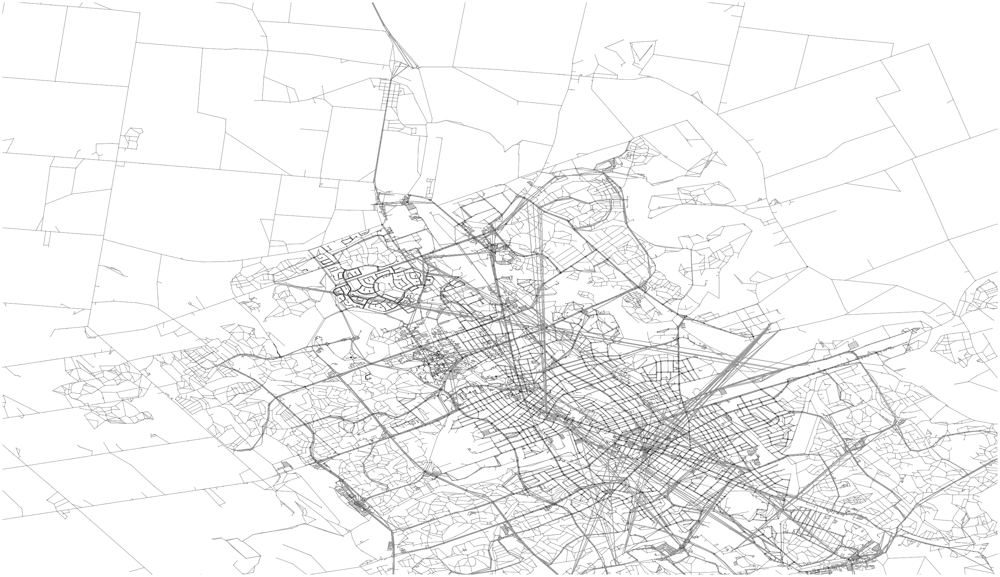

(<Figure size 3656.29x2160 with 1 Axes>, <AxesSubplot:>)

In [27]:
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=1.1, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

Too many bins requested, using max bins possible. To avoid duplicate edges, 3 bins used.
Figure created. Took 46.11 seconds


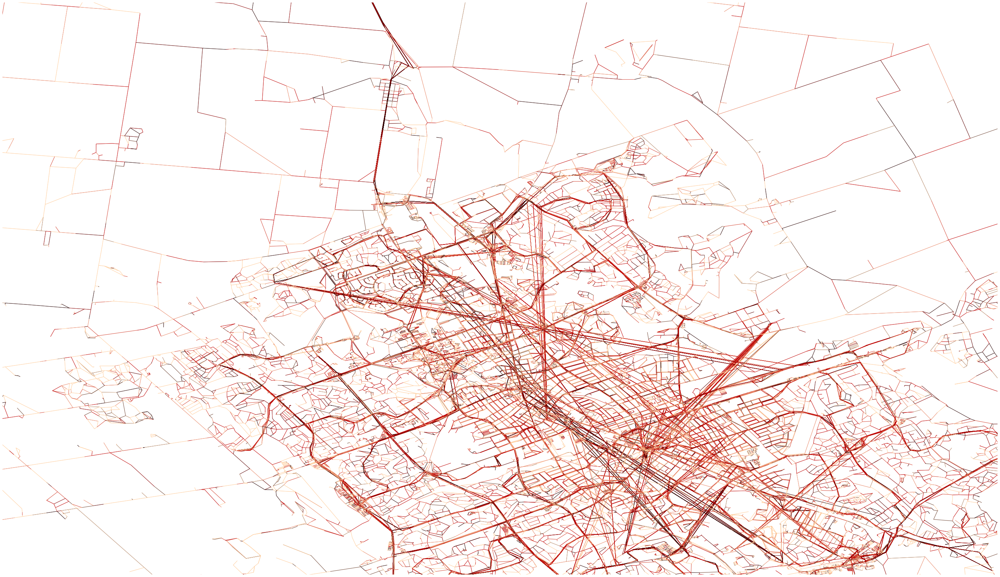

(<Figure size 3656.29x2160 with 1 Axes>, <AxesSubplot:>)

In [28]:
edgecolor = ua.plot.col_colors(df=urbanaccess_net.net_edges, col='weight', cmap='gist_heat_r', num_bins=5)
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color=edgecolor, edge_linewidth=1, edge_alpha=0.7,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

Too many bins requested, using max bins possible. To avoid duplicate edges, 3 bins used.
Figure created. Took 45.09 seconds


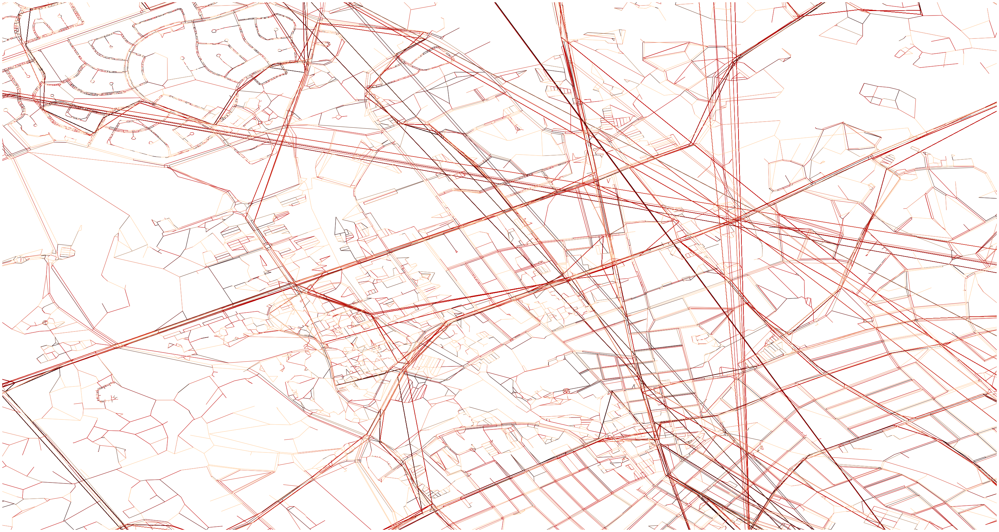

(<Figure size 3970.4x2160 with 1 Axes>, <AxesSubplot:>)

In [29]:
edgecolor = ua.plot.col_colors(df=urbanaccess_net.net_edges, col='weight', cmap='gist_heat_r', num_bins=5)
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=(-80.567224,43.457155,-80.497981,43.494825),
                 fig_height=30, margin=0.02,
                 edge_color=edgecolor, edge_linewidth=1, edge_alpha=0.7,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

Figure created. Took 31.74 seconds


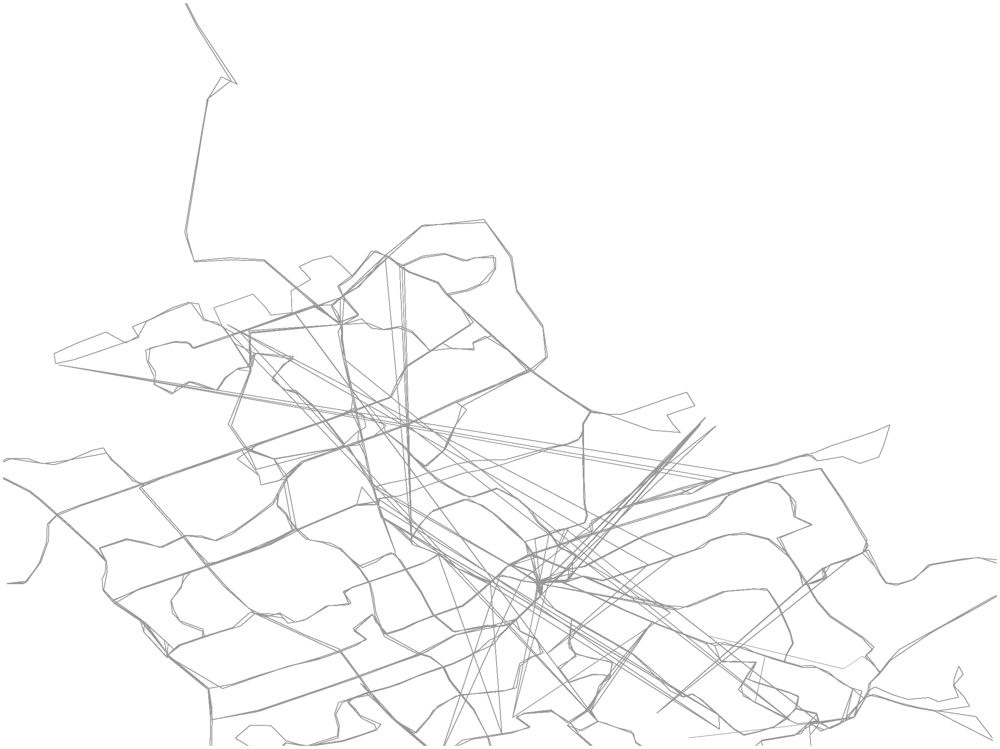

(<Figure size 2814.17x2160 with 1 Axes>, <AxesSubplot:>)

In [30]:
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type']=='transit'],
                 bbox=None,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

Figure created. Took 19.48 seconds


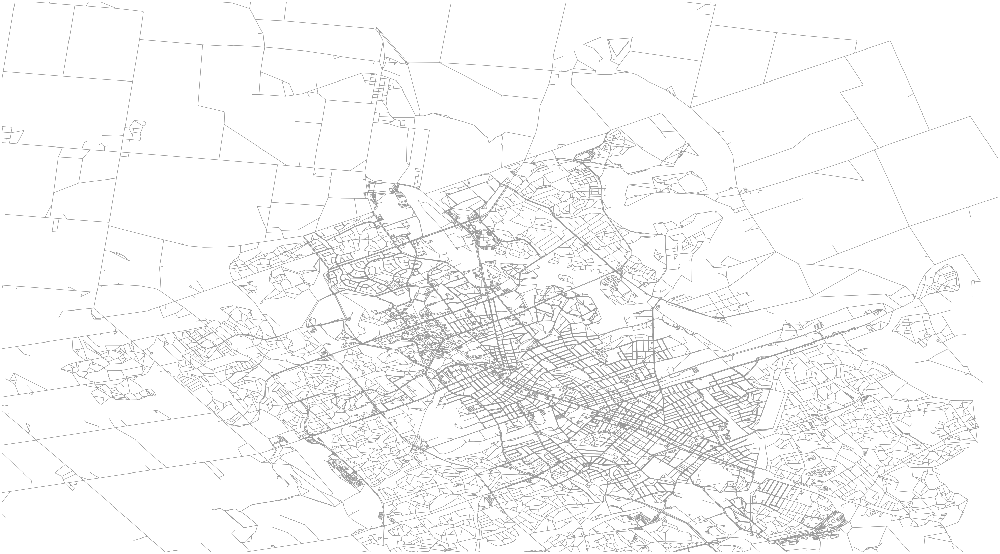

(<Figure size 3806.89x2160 with 1 Axes>, <AxesSubplot:>)

In [31]:
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type']=='walk'],
                 bbox=None,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

In [32]:
urbanaccess_net.net_edges['unique_route_id'].unique()

array(['9904_grand_river_transit', '92_grand_river_transit',
       '202_grand_river_transit', '201_grand_river_transit',
       '3_grand_river_transit', '27_grand_river_transit',
       '8_grand_river_transit', '10_grand_river_transit',
       '9_grand_river_transit', '21_grand_river_transit',
       '4_grand_river_transit', '73_grand_river_transit',
       '29_grand_river_transit', '6_grand_river_transit',
       '5_grand_river_transit', '14_grand_river_transit',
       '13_grand_river_transit', '11_grand_river_transit',
       '31_grand_river_transit', '22_grand_river_transit',
       '200_grand_river_transit', '12_grand_river_transit',
       '52_grand_river_transit', '20_grand_river_transit',
       '2_grand_river_transit', '1_grand_river_transit',
       '204_grand_river_transit', '34_grand_river_transit',
       '23_grand_river_transit', '9903_grand_river_transit',
       '7_grand_river_transit', nan], dtype=object)

Figure created. Took 0.98 seconds


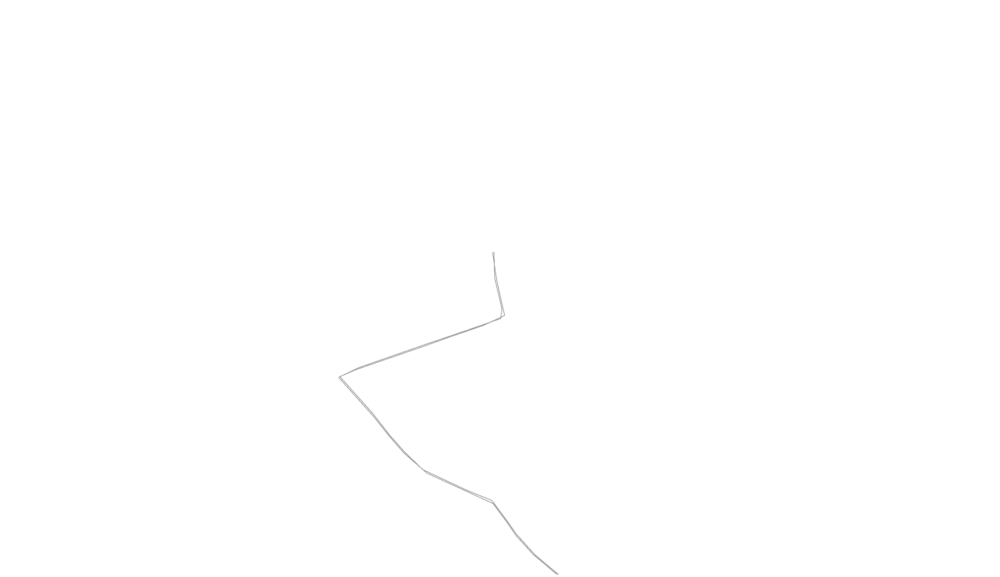

(<Figure size 3656.29x2160 with 1 Axes>, <AxesSubplot:>)

In [33]:
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges[urbanaccess_net.net_edges['unique_route_id']=='201_grand_river_transit'],
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

In [34]:
ua.gtfs.headways.headways(gtfsfeeds_df=loaded_feeds,
                          headway_timerange=['07:00:00','10:00:00'])

Stop times from 07:00:00 to 10:00:00 successfully selected 54,279 records out of 310,184 total records (17.50 percent of total). Took 0.10 seconds
Starting route stop headway calculation for 2,034 route stops...
Route stop headway calculation complete. Took 6.44 seconds
headway calculation complete. Took 7.36 seconds


In [35]:
ua.network.integrate_network(urbanaccess_network=urbanaccess_net,
                             headways=True,
                             urbanaccess_gtfsfeeds_df=loaded_feeds,
                             headway_statistic='mean')

Loaded UrbanAccess network components comprised of:
     Transit: 2,742 nodes and 52,264 edges;
     OSM: 44,749 nodes and 130,126 edges
routes successfully joined to transit nodes. Took 0.20 seconds
Connector edges between the OSM and transit network nodes successfully completed. Took 1.50 seconds
mean route stop headway will be used for pedestrian to transit edge impedance.
Headway impedance calculation completed. Took 0.11 seconds
Edge and node tables formatted for Pandana with integer node ids: id_int, to_int, and from_int. Took 5.54 seconds
Network edge and node network integration completed successfully resulting in a total of 46,782 nodes and 289,190 edges:
     Transit: 2,033 nodes 52,264 edges;
     OSM: 44,749 nodes 130,126 edges; and
     OSM/Transit connector: 106,800 edges.


Figure created. Took 43.04 seconds


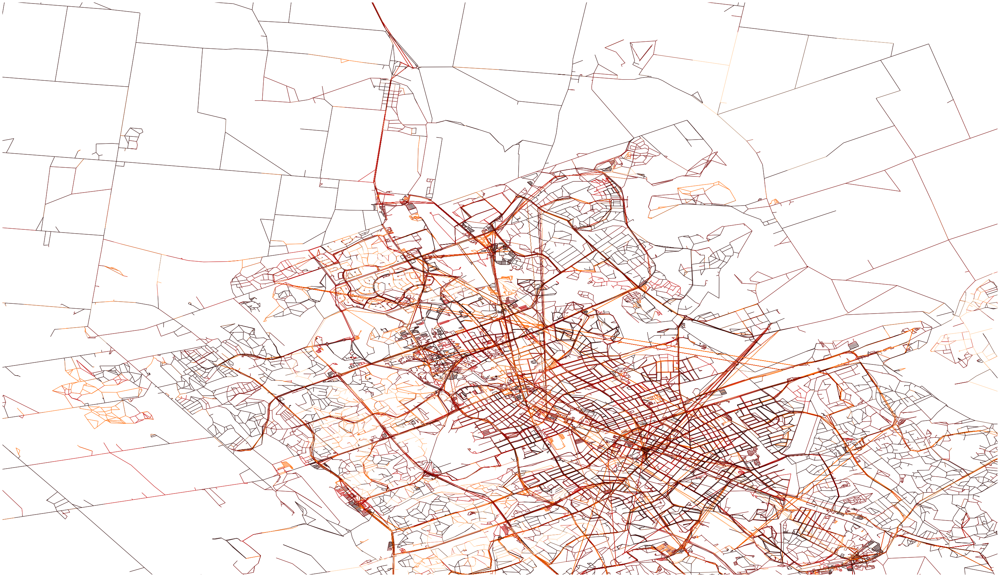

(<Figure size 3656.29x2160 with 1 Axes>, <AxesSubplot:>)

In [36]:
edgecolor = ua.plot.col_colors(df=urbanaccess_net.net_edges, col='weight', cmap='gist_heat_r', num_bins=5)
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color=edgecolor, edge_linewidth=1, edge_alpha=0.7,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)